# Dog breed Classification with Neural Network

End-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

Data from https://www.kaggle.com/competitions/dog-breed-identification/data.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Information about the data:
* Images (unstructured data).
* There are 120 breeds of dogs (different).
* There are 10,000+ images in the training and test sets
* Training images have labels, it is the breeds


# Import libraries

In [52]:
#!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [49]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt
import datetime

TF version: 2.15.0
TF Hub version: 0.16.1


In [50]:
# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


# Getting the data ready

In [51]:
# Checkout the labels of our data
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180

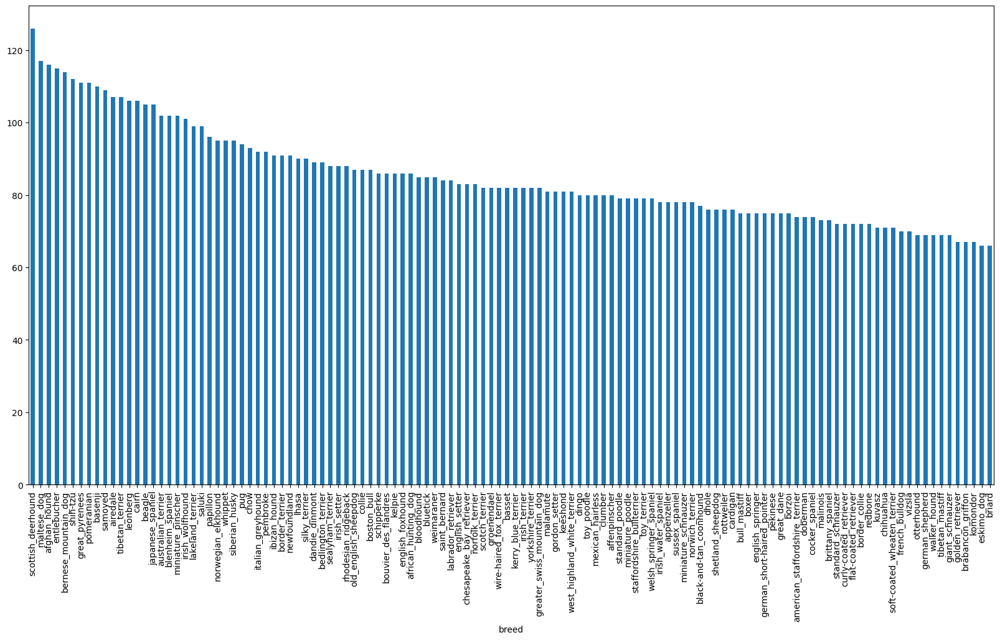

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

### Getting images and their labels

In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
if len(os.listdir("/content/drive/MyDrive/Dog vision/train")) == len(filenames):
  print("Lenght is match")
else:
  print("Lenght doesn't match")

Lenght is match


In [ ]:
# Get labels
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Check number of labels and number of filenames
if len(labels) == len(filenames):
  print("Lenght is match")
else:
  print("Lenght doesn't match")

Lenght is match


In [ ]:
# Unique labels
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Create validation set

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

Start with 1000 images, 10.000+ is too many

In [ ]:
# Set number of images to use
num_images = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [ ]:
# Split data into train and validation of total size num_images
X_train, X_val, y_train, y_val = train_test_split(X[:num_images],
                                                    y[:num_images],
                                                    test_size=0.2,
                                                    random_state=0)

# Data shape check
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images (tuning images into tensors)

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn the `image` into Tensors
4. Normalize the image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224), This need to the model, it is the input
6. Return the modified `image`

Check what importing in neural network

In [ ]:
# Convert image to numpy array
image = imread(filenames[0])
image.shape # height, width, colour channel (RGB, red green blue)

(375, 500, 3)

In [ ]:
image[:2]

array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]]], dtype=uint8)

In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]]], dtype=uint8)>

In [ ]:
# Define image size
img_size = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=img_size):
  # Turn the image into a tensor
  image = tf.io.read_file(image_path) # read file
  # turn the jpeg image into numberical Tensor with 3 color channels (Red, Green, Blue)
  # this command do the same thing then tf.constant
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  # its normalization, so that there are no outliers
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to (224,224)
  image = tf.image.resize(image, size=[img_size, img_size])
  return image


## Turning data into batches

Why turn the data into batches?

When trying to process 10,000+ images in one go, they all might not fit into memory.

This is why use 32 (this is the batch size) images at a time.

In order to use TensorFlow effectively, the data need in this form:
`(image, label)`

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

A way to turn the data into tuples of Tensors in the form: `(image, label)`. Now make a function to turn all data into X and y

In [ ]:
# Define the batch size, 32 is the start
batch_size = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=batch_size, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, it doesn't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # if the data is a valid dataset, it doesn't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # label
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # label
    # Shuffling the data before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the data into batches
    data_batch = data.batch(batch_size)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
# Create a funtion for viewing images in a data batch
def show_25_images(images, labels):
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Turn the grid lines off
    plt.axis("off")
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

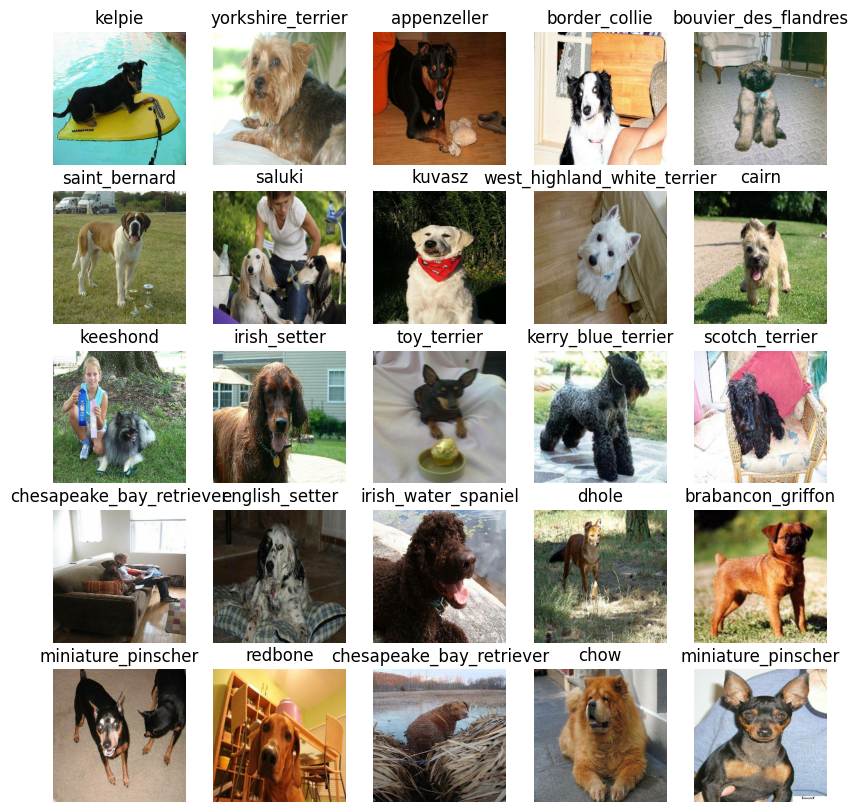

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# Building a model

There are a few things need to define:
- The input shape (images shape, in the form of Tensors) to the model
- The output shape (image labels, in the form of Tensors) of the model.
- The URL of the model what I want to use

In [ ]:
# Setup input shape to the model
input_shape = (None, img_size, img_size, 3) # batch, height, width, colour channels (R,G,B)

# Setup output shape of our model
output_shape = len(unique_breeds)

# Setup model URL from Kaggle
model_url = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Inputs and outputs ready for the model

create a function which:
* Takes the input shape, output shape and the model I have chosen as parameters.
* Define the layers in a Keral model in sequential fashion.
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape  it will be gettint).
* Returns the model.

In [ ]:
# Create a function which builds a Keral model
def create_model(input_shape=input_shape, output_shape=output_shape, model_url=model_url):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=output_shape, activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape=input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

I will create 2 callbacks, one for TensorBoard which helps track the models progress and another for early stopping which prevents the model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()` function.
3. Visualize the models training logs with `%tensorboard` function.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog vision/logs",
                        # Make it so the logs get tracked whenever run an expreiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback



In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                    patience=3)

## Training a model (on subset of data)

First model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
num_epochs = 100 #@param {type:"slider", min:10, max:100, step:10}

Create a function which trains a model

* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()`.
* Call the `fit()` function on the model passing it the training data, validation data, number of epochs to train for (`num_epochs`) and the callbacks.
* Return the model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  # Create a model
  model = create_model()
  # Create new TensorBoard sepecific to model
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data,
            epochs=num_epochs,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [36]:
# Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 290s 12s/step - loss: 4.5842 - accuracy: 0.1125 - val_loss: 3.3550 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 53s 2s/step - loss: 1.6042 - accuracy: 0.7063 - val_loss: 2.1692 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 62s 2s/step - loss: 0.5452 - accuracy: 0.9563 - val_loss: 1.7111 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 53s 2s/step - loss: 0.2400 - accuracy: 0.9937 - val_loss: 1.5503 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 68s 3s/step - loss: 0.1374 - accuracy: 1.0000 - val_loss: 1.4766 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 53s 2s/step - loss: 0.0953 - accuracy: 1.0000 - val_loss: 1.4380 - val_accuracy: 0.6350
Epoch 7/100
25/25 [=============================

### Checking the TensorBoard logs

The TensorBoard function (`%tensorboard`) will acces the logs directory I created earlier and visualize its contents

In [37]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

Its look like overfitting because the accuracy is too high on he train data and on the validation is too low


### Making and evaluating predictions using a trained model

In [38]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [39]:
# Make predictions on the validation data (no used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 12s 2s/step


array([[4.3614462e-04, 9.5326950e-06, 2.0377932e-04, ..., 4.8017977e-05,
        8.9541348e-03, 6.3763084e-03],
       [5.4450491e-03, 1.8401322e-03, 1.2335198e-03, ..., 5.5213389e-04,
        2.0477681e-03, 1.5926285e-04],
       [7.3796099e-07, 1.6636530e-05, 1.9438012e-06, ..., 2.3863320e-05,
        2.2593435e-04, 5.9696999e-06],
       ...,
       [4.9545735e-05, 9.2462076e-05, 6.9643902e-05, ..., 1.7212836e-02,
        6.3649757e-04, 5.9786711e-05],
       [4.1420190e-04, 1.3360091e-05, 6.0572329e-05, ..., 8.2777718e-05,
        2.2565160e-04, 8.7412848e-04],
       [1.9046625e-04, 3.3688662e-03, 3.4818141e-04, ..., 1.3789455e-03,
        1.2670509e-02, 5.8460858e-04]], dtype=float32)

In [ ]:
predictions.shape

In [41]:
len(y_val)

200

In [42]:
len(unique_breeds)

120

In [43]:
# First prediction
# this is the softmax algorithm, which breed has the highest chance, the dog will be this breed
index = 3
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[9.0527712e-05 1.8595932e-05 3.1972020e-06 9.2945929e-06 2.9441691e-05
 4.4995850e-06 1.8211975e-05 2.0214649e-05 1.8005758e-05 2.1340380e-05
 2.6473828e-04 1.4728555e-04 2.3313072e-05 4.3986631e-05 3.7509188e-05
 9.0288195e-05 4.8854085e-06 1.9523492e-05 9.7226912e-06 1.6063997e-05
 4.1351354e-06 2.8894617e-06 6.9609368e-06 3.9624792e-06 5.9544477e-06
 4.0359741e-05 9.7164302e-05 2.5183630e-07 9.5380292e-06 6.4910359e-06
 4.6676064e-06 1.3032890e-03 5.6101700e-05 7.5719345e-07 1.2239005e-05
 3.9192164e-04 2.8928807e-06 5.1872922e-07 2.0421990e-06 2.7979995e-06
 3.8725513e-05 1.3467433e-06 1.4979183e-06 1.0558966e-05 1.7531898e-05
 7.9329029e-06 1.6265411e-06 2.1743906e-06 2.9748328e-06 7.9218726e-06
 5.8194343e-07 6.1639789e-06 1.1945659e-04 4.9046698e-06 8.3028061e-07
 9.4601086e-07 1.0995651e-05 1.4443300e-05 2.6548933e-05 9.6384909e-05
 1.1881177e-05 8.8191795e-05 2.8456267e-05 2.2665354e-06 1.8516423e-05
 2.9598699e-05 8.7211971e-05 3.0517793e-05 1.2586509e-04 8.5343072e-06
 6.524

In [44]:
unique_breeds[73]

'maltese_dog'

In [79]:
# Turn prediction probability into their respective label
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_labels = [get_pred_label(pred) for pred in predictions]
pred_labels[:10]

['standard_schnauzer',
 'bernese_mountain_dog',
 'bedlington_terrier',
 'maltese_dog',
 'curly-coated_retriever',
 'toy_poodle',
 'chesapeake_bay_retriever',
 'basset',
 'bernese_mountain_dog',
 'soft-coated_wheaten_terrier']

Now since the validation data is still in a batch dataset, I will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels.

In [46]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.08032143, 0.06946708, 0.07338866],
         [0.61778015, 0.6165897 , 0.6105323 ],
         [0.05855922, 0.04521888, 0.01893852],
         ...,
         [0.25461388, 0.2310845 , 0.2310845 ],
         [0.2409634 , 0.2376371 , 0.22979397],
         [0.20273955, 0.20192525, 0.19408211]],
 
        [[0.05953991, 0.04868557, 0.05260714],
         [0.50224674, 0.5016449 , 0.49507308],
         [0.03474972, 0.02140586, 0.00348047],
         ...,
         [0.25207633, 0.2285469 , 0.2285469 ],
         [0.21285719, 0.19886254, 0.19438948],
         [0.2434503 , 0.23217663, 0.22679318]],
 
        [[0.05889997, 0.04804562, 0.05196719],
         [0.39864296, 0.39786038, 0.39886352],
         [0.02538222, 0.01172675, 0.00321529],
         ...,
         [0.25050467, 0.22966257, 0.22160059],
         [0.20726216, 0.18679479, 0.17854546],
         [0.27821386, 0.25335288, 0.24647257]],
 
        ...,
 
        [[0.4689106 , 0.4571459 , 0.42185178],
         [0.52996   , 0.5181953 , 0.48290

In [86]:
get_pred_label(val_labels[0])
val_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

I have got ways to get:

* Prediction labels
* Validation labels(truth labels)
* Validation images

I will create a function which:

* Takes an array of prediction probabilities , an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted labels, its predicted probability, the truth label and the target image on a single plot.

In [107]:
# This function visualize one prediction
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label_ = get_pred_label(pred_prob)
  true_label_ = get_pred_label(true_label)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction
  if (pred_label_ == true_label_):
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truht label
  plt.title('{} {:2.0f}% {}'.format(pred_label_,
                                     np.max(pred_prob)*100,
                                     true_label_),
                                     color=color)

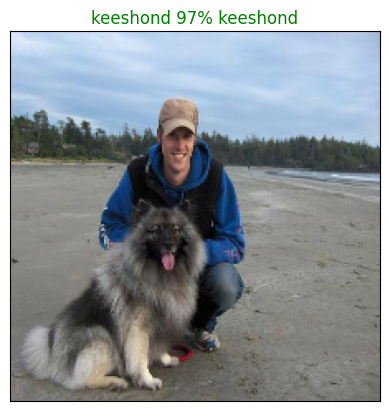

In [108]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n=81)

This fucntion will:

* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the predcition using get_pred_label()
* Find the top 10:
 * Prediction probabilites indexes
 * Prediction probabilities values
 * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green

In [114]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label_ = get_pred_label(pred_prob)
  true_label_ = get_pred_label(true_label)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # finr the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # change the colour of true label
  if np.isin(true_label_, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label_)].set_color('green')
  else:
    pass

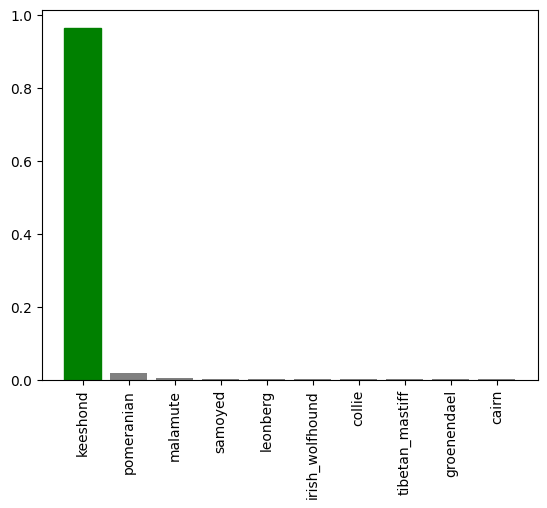

In [117]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=81)

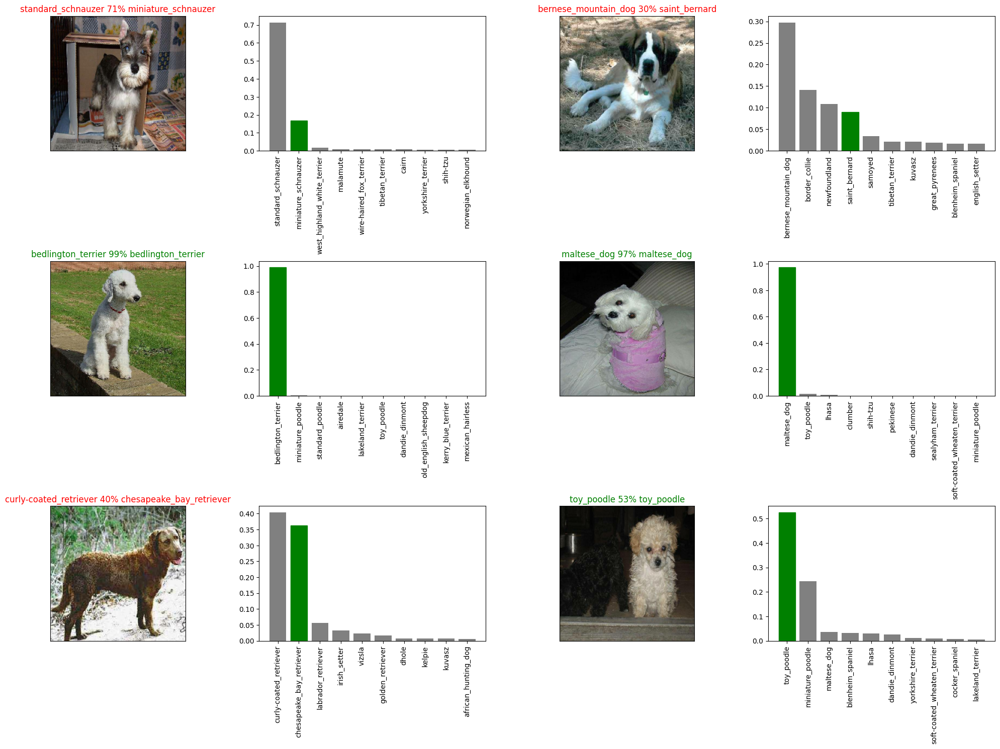

In [116]:
# Check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()